In [1]:
import layoutparser as lp 

import matplotlib.pyplot as plt
%matplotlib inline 

import pandas as pd
import numpy as np
import cv2

In [2]:
ocr_agent = lp.TesseractAgent(languages = ['en', 'fa'])

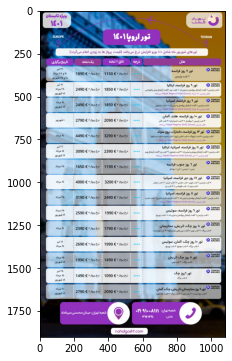

In [3]:
image = cv2.imread('./sample/orig/Europe.jpg')
plt.figure(figsize=(8, 6))
plt.imshow(image)

In [4]:
res = ocr_agent.detect(image, return_response=True)

In [5]:
layout = ocr_agent.gather_data(res, agg_level=lp.ocr.TesseractFeatureType.WORD)

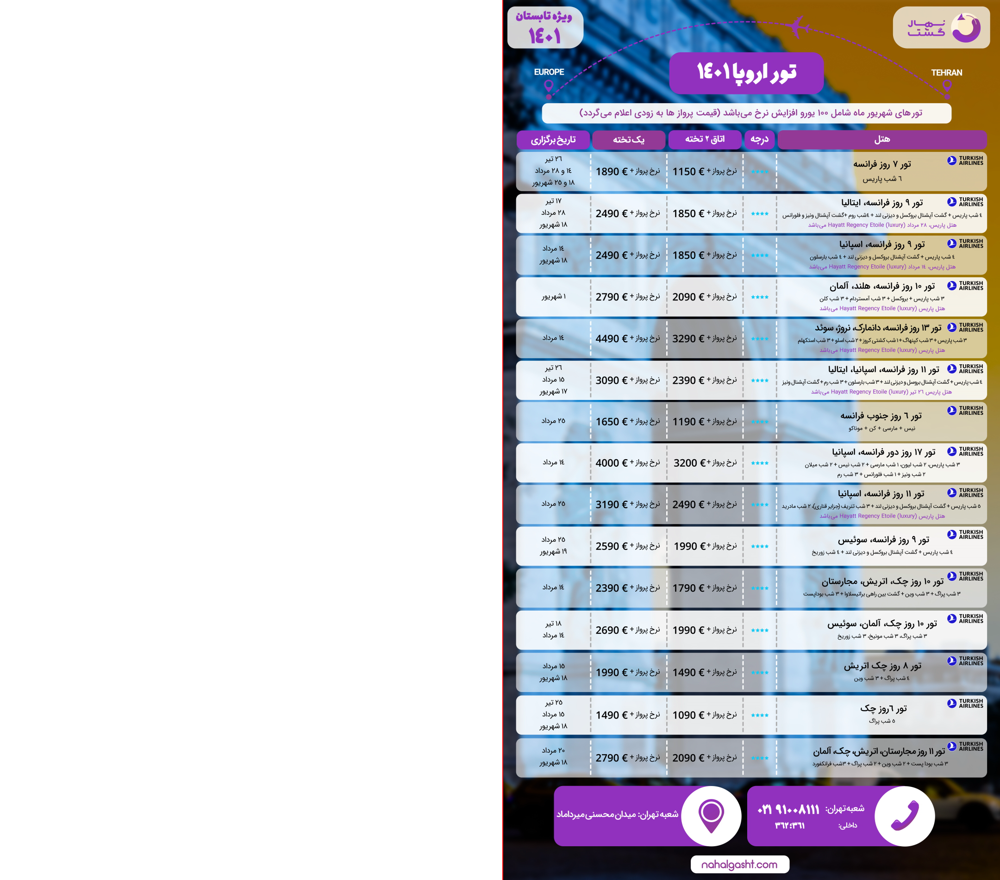

In [6]:
lp.draw_text(image, layout, font_size=12, with_box_on_text=True,
             text_box_width=4)

In [8]:
image = image[..., ::-1]

In [12]:
model = lp.Detectron2LayoutModel('lp://TableBank/faster_rcnn_R_101_FPN_3x/config',
                                #  extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.3],
                                 label_map={0: "Table"})

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


In [24]:
layout = model.detect(image)

/home/nik/anaconda3/envs/ttocrdl39/lib/python3.9/site-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


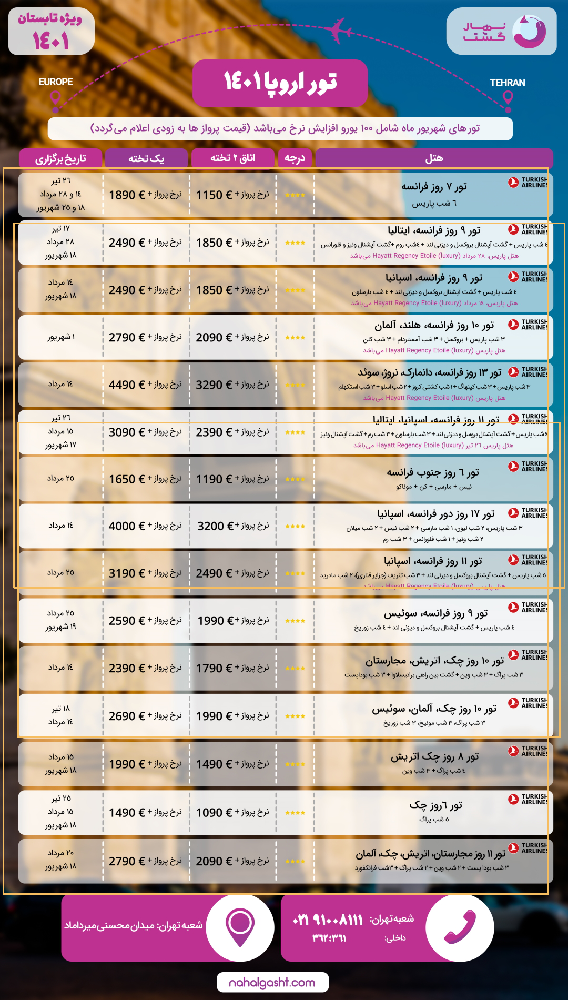

In [25]:
lp.draw_box(image, layout, box_width=3)

In [26]:
layout_union = layout[0]
for lay in layout:
    layout_union = lay.union(layout_union)
layout_union

TextBlock(block=Rectangle(x_1=6.562495231628418, y_1=319.34698486328125, x_2=1073.2904052734375, y_2=1699.861572265625), text=None, id=None, type=Table, parent=None, next=None, score=0.07101038843393326)

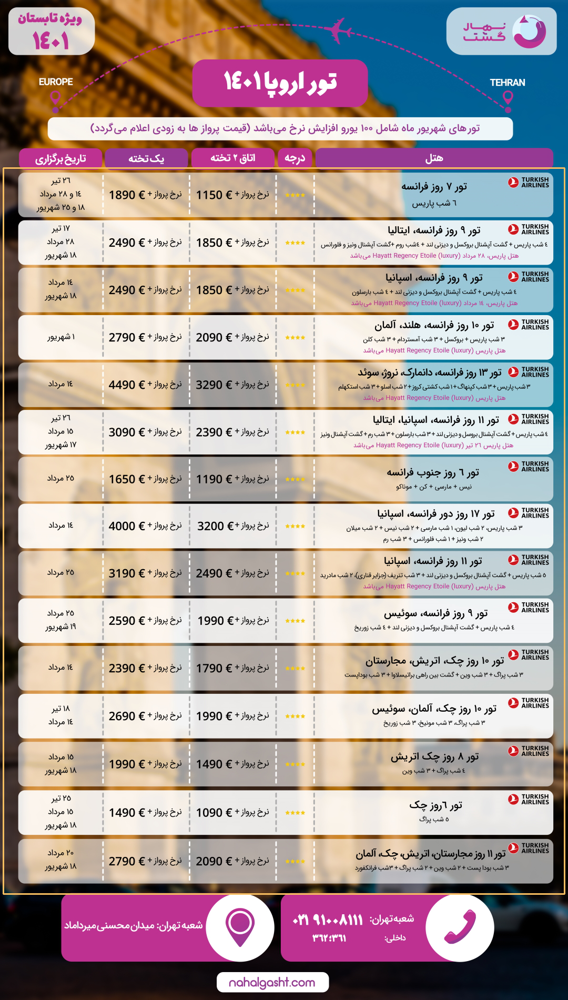

In [27]:
lp.draw_box(image, [layout_union], box_width=3)

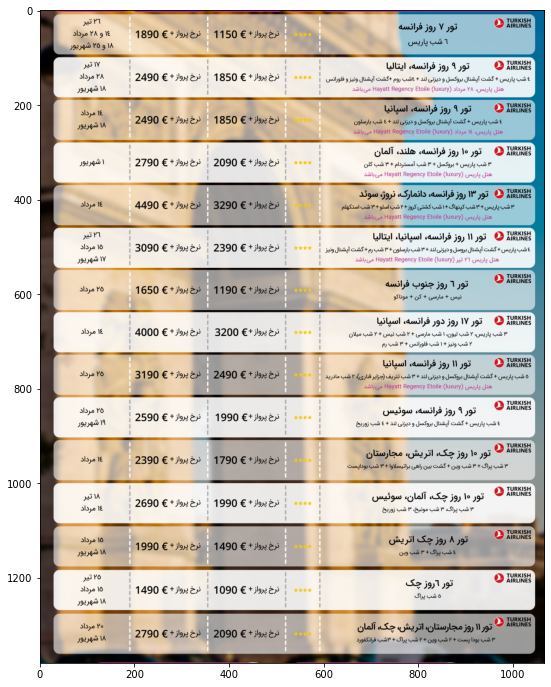

In [35]:
cropped_image = layout_union.crop_image(image)
plt.figure(figsize=(16, 12))
plt.imshow(cropped_image)

In [58]:
tesseract_ocr_configs = r'--oem 3 --dpi 300'
ocr_agent = lp.TesseractAgent(languages = ['en', 'fa'],)
res = ocr_agent.detect(cropped_image, return_response=True)
layout = ocr_agent.gather_data(res, agg_level=lp.ocr.TesseractFeatureType.WORD)

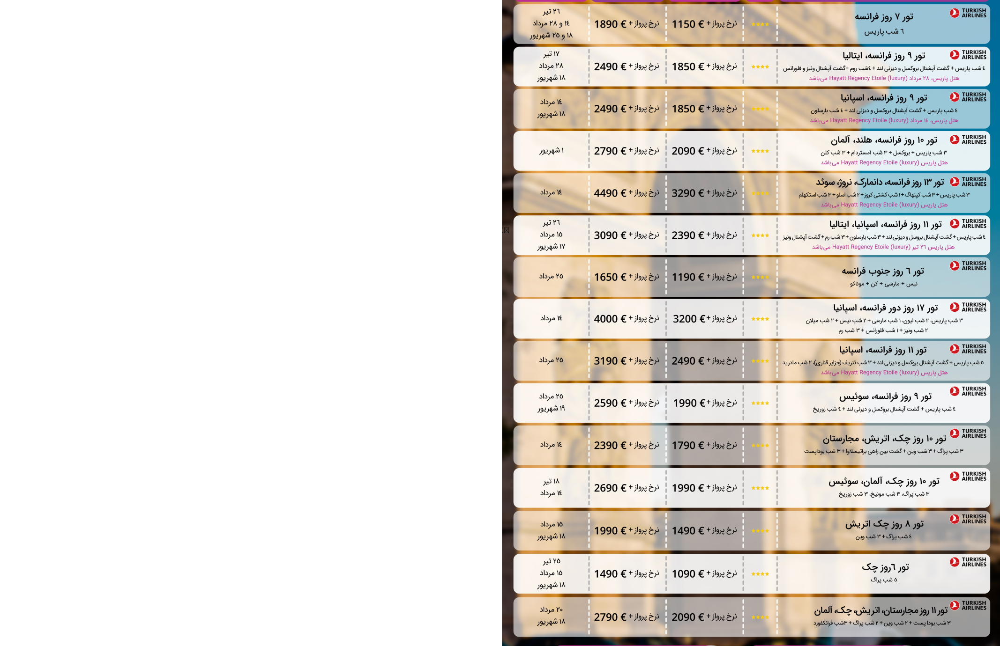

In [59]:
lp.draw_text(cropped_image, layout, font_size=12, with_box_on_text=True,
             text_box_width=3)